In [297]:
import matplotlib.pyplot as plt
import numpy as np
import pdbtools
import potential
import torch
import torch.nn as nn
from scipy.interpolate import CubicSpline
from skimage.feature import peak_local_max
from tqdm import tqdm

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [380]:
def plot3d(vol):
    fig, axes = plt.subplots(1, 3, dpi=200, constrained_layout=True)
    for i, ax in enumerate(axes.ravel()):
        im = ax.imshow(vol.sum(i))
        ax.set(xticks=[], yticks=[], title=f"projection along axis {i}")
        fig.colorbar(im, ax=ax, location="bottom")
    plt.show()


def plot_slices(
    vol, start_idx=0, end_idx=None, axis=0, ylabel=None, vmin=None, vmax=None
):
    nslices = 5
    sh = vol.shape
    if end_idx is None:
        idx_length = sh[axis] - start_idx - 1
        end_idx = start_idx + idx_length
    else:
        idx_length = end_idx - start_idx
    idx_interval = idx_length // nslices
    indices = torch.linspace(start_idx, end_idx, nslices).type(torch.int)

    fig, axes = plt.subplots(1, 5, dpi=200, figsize=(8, 2.8), constrained_layout=True)
    for ax, i in zip(axes.ravel(), indices):
        ax.set(xticks=[], yticks=[])
        if axis == 0:
            im = ax.imshow(vol[i, :, :], vmin=vmin, vmax=vmax)
        elif axis == 1:
            im = ax.imshow(vol[:, i, :], vmin=vmin, vmax=vmax)
        elif axis == 2:
            im = ax.imshow(vol[:, :, i], vmin=vmin, vmax=vmax)
        ax.set_title(f"Slice {i}")
        fig.colorbar(im, ax=ax, location="bottom")

    if ylabel is not None:
        axes[0].set_ylabel(ylabel)
    # plt.suptitle(f"Slices along axis {axis}")
    plt.show()

In [3]:
fftn = lambda array: torch.fft.fftshift(torch.fft.fftn(torch.fft.ifftshift(array)))
ifftn = lambda array: torch.fft.fftshift(torch.fft.ifftn(torch.fft.ifftshift(array)))

In [67]:
def get_coordinates_from_frame(line_number, no_atoms=128000):
    coords = torch.zeros(no_atoms, 3)
    for i, s in enumerate(lines[line_number : line_number + no_atoms]):
        id, typ, x, y, z = s.split()
        coords[i, 0] = float(x)
        coords[i, 1] = float(y)
        coords[i, 2] = float(z)
    return coords

In [68]:
def trim_coordinates(coords, trim_size=100):
    trimmed_coords = []
    for co in coords:
        if not (
            torch.abs(co[0]) > trim_size // 2
            or torch.abs(co[1]) > trim_size // 2
            or torch.abs(co[2]) > trim_size // 2
        ):
            trimmed_coords.append(co)
    trimmed_coords = torch.stack(trimmed_coords)
    return trimmed_coords

In [19]:
def radial_profile_3d(data, center=None, return_r=False):
    m, n, o = np.shape(data)
    if center is None:
        center = 0, 0, 0
    x = np.arange(n) - (n) // 2 + center[0]
    y = np.arange(m) - (m) // 2 + center[1]
    z = np.arange(o) - (m) // 2 + center[2]
    xx, yy, zz = np.meshgrid(x, y, z, indexing="ij")
    r = np.sqrt(xx**2 + yy**2 + zz**2)
    r = r.round().astype(int)
    tbin = np.bincount(r.ravel(), data.ravel())
    nr = np.bincount(r.ravel())
    radialprofile = tbin / nr
    if return_r:
        return r, radialprofile
    else:
        return radialprofile

In [443]:
m, n, o = np.shape(ices[0])
center = 0, 0, 0
x = np.arange(n) - (n) // 2 + center[0]
y = np.arange(m) - (m) // 2 + center[1]
z = np.arange(o) - (m) // 2 + center[2]
xx, yy, zz = np.meshgrid(x, y, z, indexing="ij")
r = np.sqrt(xx**2 + yy**2 + zz**2)
# r = r.round().astype(int)

In [444]:
rt = radial_profile_3d(r)

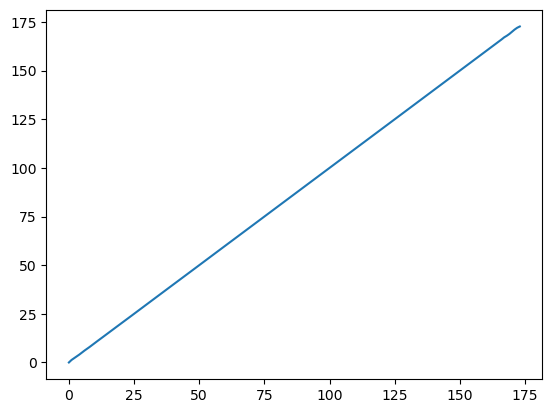

In [445]:
plt.plot(rt)

## Open dump file
For stackingDisordered_20x20x20.MW_temp400.dump, the ice are melted at 400K under simulations at constant volume (so to keep density at 0.9400 cm^3/g). There is 128,000 mono-atomic water (they refer to this water model as they are modelling water molecule as one particle).
The simutlation time steps are 10 fs, ran for a total of 100,000 steps (so a total of 1,000,000 fs or 1 ns in simulation time). So the output frames are saved every 10,000 steps, leading to a total of 100 frames.

In [4]:
with open("ice-data/stackingDisordered_20x20x20.MW_temp400.dump") as f:
    lines = f.readlines()

## Search for each frame.

In [5]:
indexes = [i for i, x in tqdm(enumerate(lines)) if x == "ITEM: TIMESTEP\n"]

12928909it [00:01, 8763294.52it/s]


## Get 90 frames of ice volume

In [348]:
dx = 0.5
n = 200
super_sampling_factor = 4

ices = []

for frame in tqdm(indexes[10:]):
    coordstart = frame + 9
    coords = get_coordinates_from_frame(coordstart)

    # recenters coordinates onto origin (0,0,0)
    center = pdbtools.center_of_particle(coords)
    centered_coords = coords - center.reshape(1, -1)
    centered_coords = trim_coordinates(centered_coords, trim_size=100)

    atomic_numbers = torch.ones(len(centered_coords), dtype=torch.int) * 8

    ice_vol_3d = potential.build_potential_volume_fftconvolve(
        atomic_numbers,
        centered_coords,
        (n, n, n),
        (dx, dx, dx),
        # atom_size_px=11,
        super_sampling_factor=super_sampling_factor,
        convention="relion",
        method="snapped-3d",
        compute_high_res=True,
        disable_tqdm=True,
    )

    ices.append(ice_vol_3d)

ices = torch.stack(ices)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 91/91 [13:07<00:00,  8.66s/it]


In [113]:
ices.shape, centered_coords.shape

(torch.Size([40, 200, 200, 200]), torch.Size([31466, 3]))

In [260]:
mdsim_ice_deltas = torch.zeros(n, n, n)
x, y, z, X, Y, Z = potential.coordinate_grid_3d((n, n, n), (dx, dx, dx))
for cc in centered_coords:
    xi, yi, zi = potential.nearest_index(x, y, z, cc[0], cc[1], cc[2])
    mdsim_ice_deltas[zi, yi, xi] = 1

In [383]:
torch.sum(mdsim_ice_deltas)

tensor(31466.)

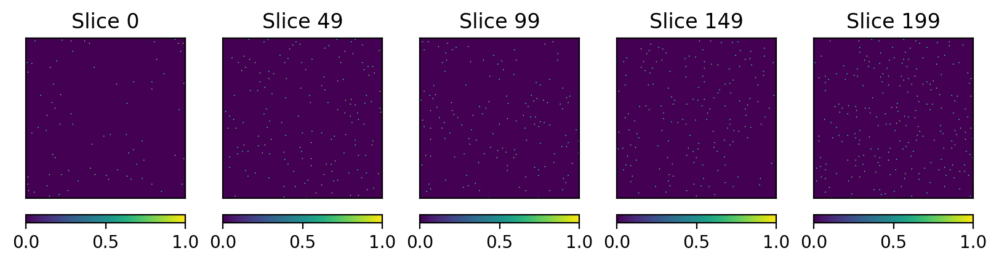

In [381]:
plot_slices(mdsim_ice_deltas)

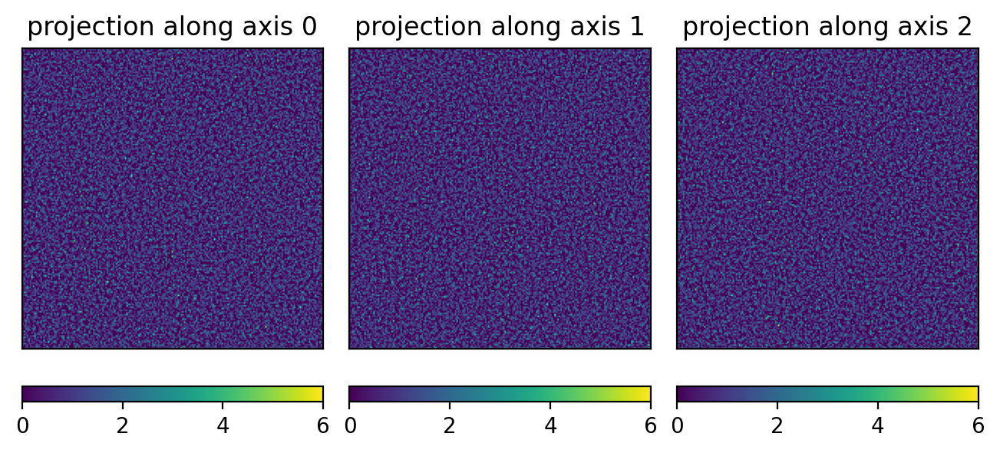

In [261]:
plot3d(mdsim_ice_deltas)

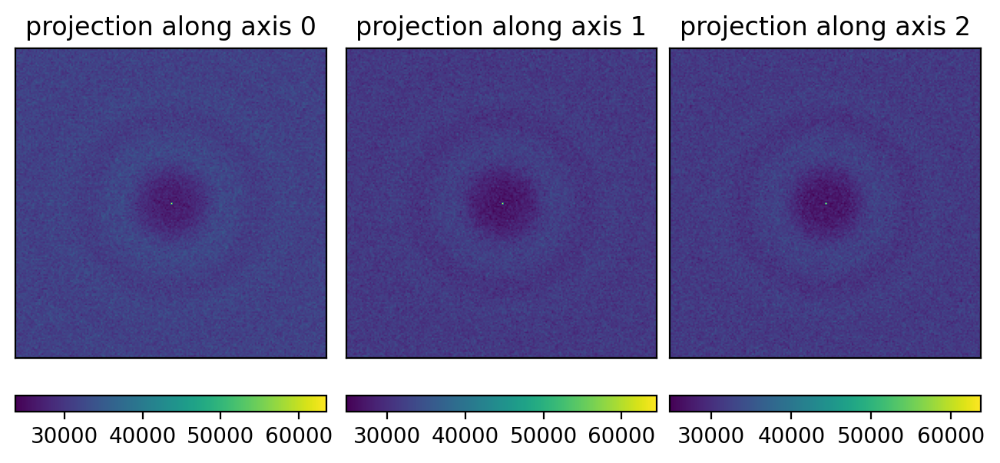

In [382]:
plot3d((torch.abs(fftn(mdsim_ice_deltas))))

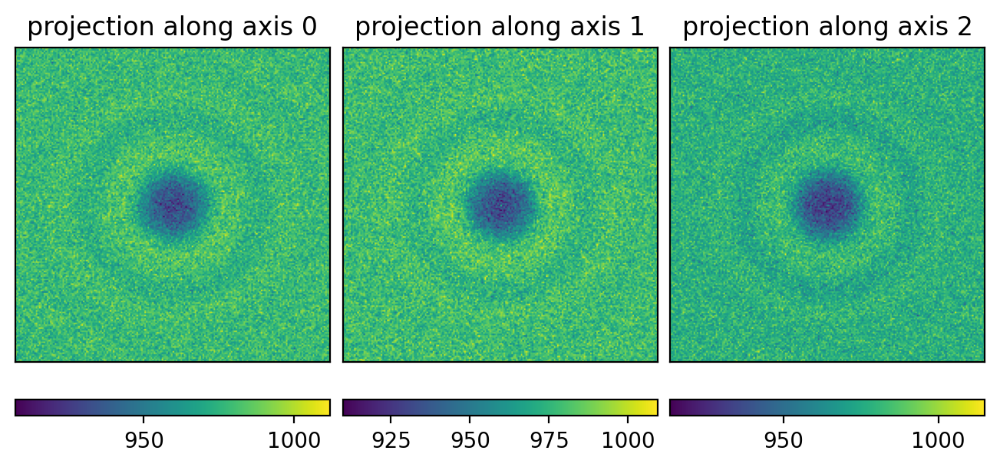

In [263]:
plot3d(torch.log(torch.abs(fftn(mdsim_ice_deltas))))

In [281]:
kx = torch.fft.fftfreq(n, dx)
dk = kx[1] - kx[0]

In [395]:
mdsim_ice_deltas_f = fftn(mdsim_ice_deltas)
radial_profile_real = radial_profile_3d(mdsim_ice_deltas_f.real)
radial_profile_imag = radial_profile_3d(mdsim_ice_deltas_f.imag)

In [396]:
k = torch.arange(len(radial_profile_real)) * dk

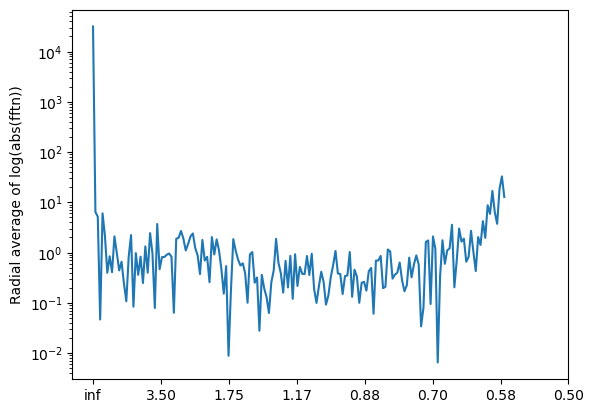

In [397]:
nticks = 8
maxk = 2
plt.semilogy(k, np.abs(radial_profile_real + 1j * radial_profile_imag))
# plt.semilogy(k, np.abs(avg_radial_profile_real + 1j*avg_radial_profile_imag))
plt.xticks(
    torch.linspace(0, maxk, nticks),
    labels=[f"{1/k:.2f}" for k in torch.linspace(0, maxk, nticks)],
)
plt.ylabel("Radial average of log(abs(fftn))")
plt.show()

## Get Fourier kernel

In [349]:
ices_f = []
for ice in tqdm(ices):
    ices_f.append(fftn(ice))
ices_f = torch.stack(ices_f)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 91/91 [00:02<00:00, 41.21it/s]


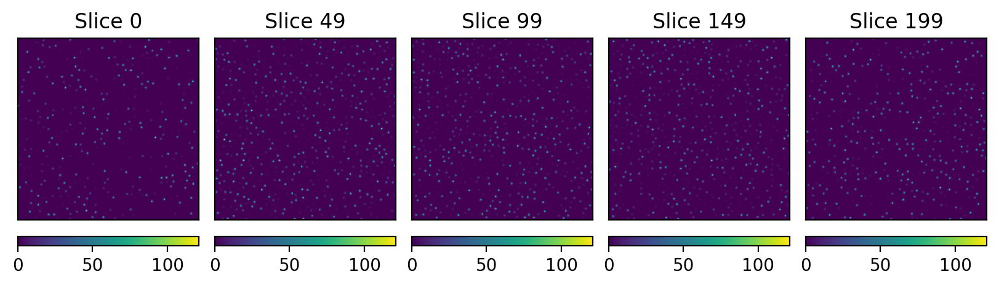

In [387]:
plot_slices(ices[0])

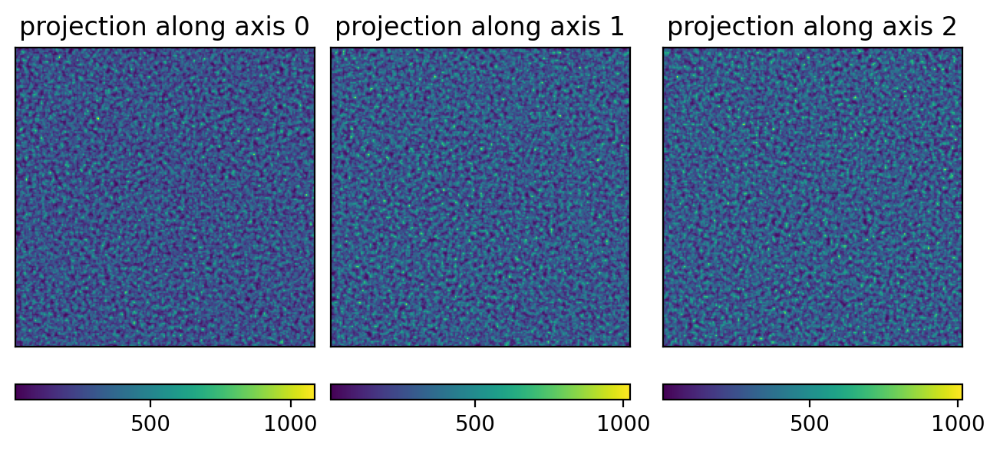

In [386]:
plot3d(ices[0])

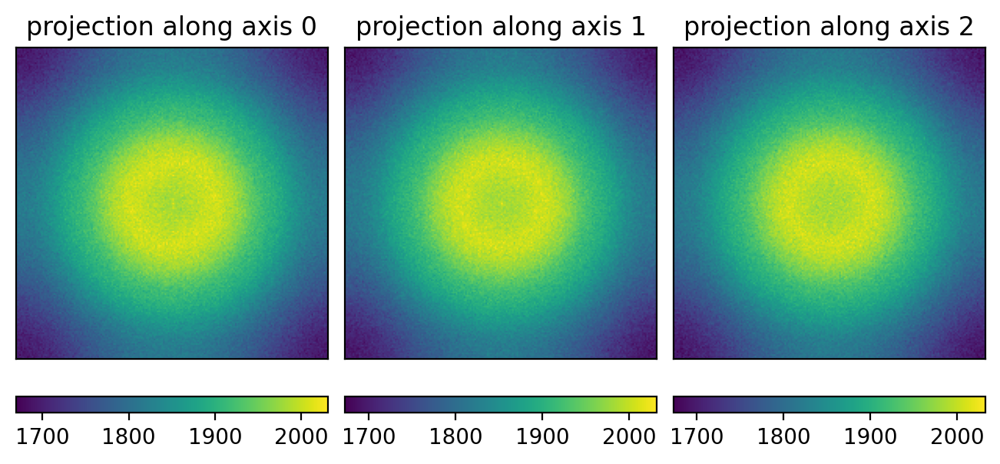

In [276]:
plot3d(torch.log(torch.abs(ices_f[0])))

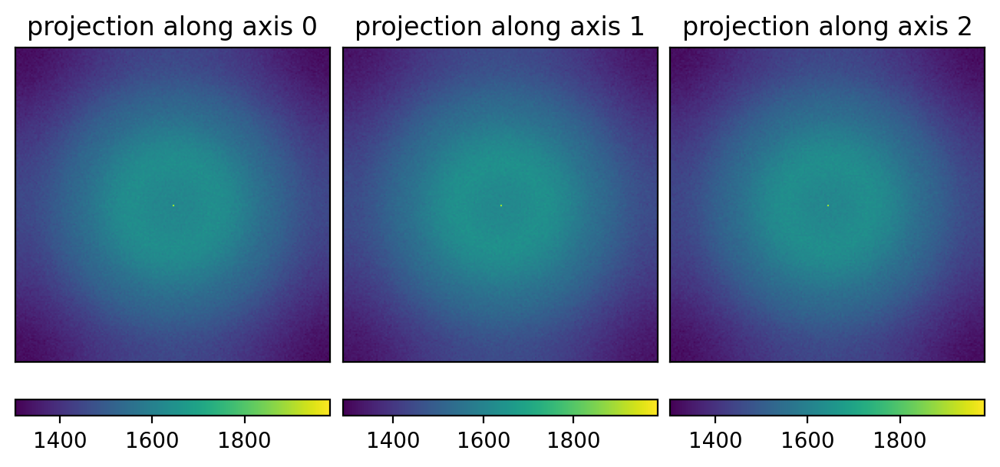

In [280]:
plot3d(torch.log(torch.abs(ices_f.mean(dim=0))))

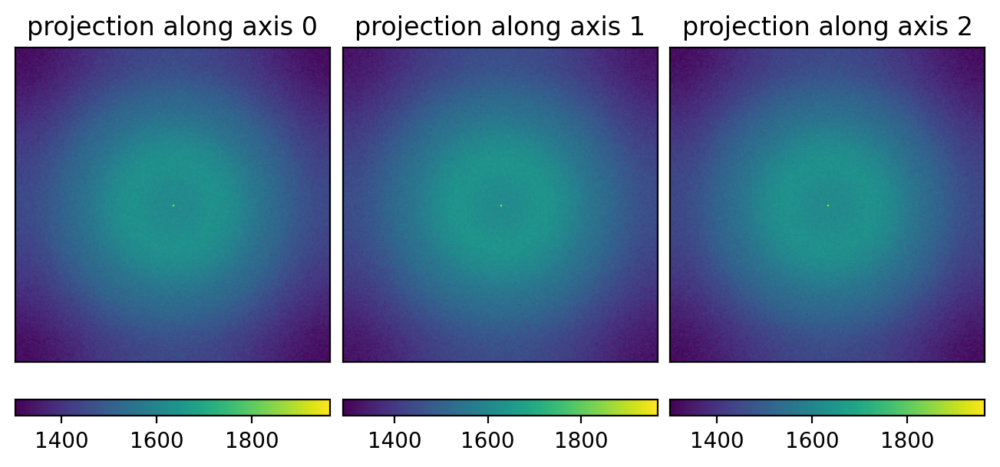

In [277]:
plot3d(torch.log(torch.abs(ices_f.mean(dim=0))))

## 3D radial average

In [281]:
kx = torch.fft.fftfreq(n, dx)
dk = kx[1] - kx[0]

In [282]:
radial_profile_real = radial_profile_3d(ices_f[0].real)
radial_profile_imag = radial_profile_3d(ices_f[0].imag)

In [283]:
avg_radial_profile_real = radial_profile_3d(ices_f.mean(dim=0).real)
avg_radial_profile_imag = radial_profile_3d(ices_f.mean(dim=0).imag)

In [284]:
k = torch.arange(len(radial_profile_real)) * dk

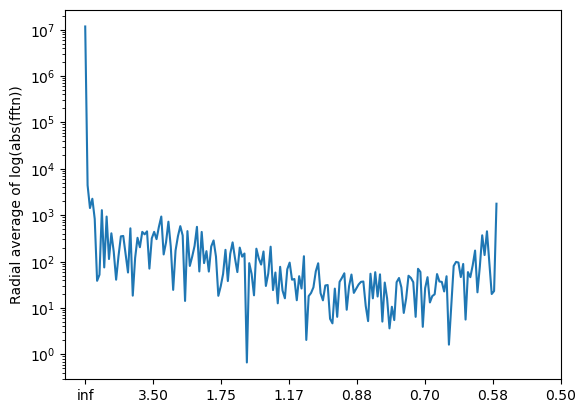

In [394]:
nticks = 8
maxk = 2
plt.semilogy(k, np.abs(radial_profile_real + 1j * radial_profile_imag))
# plt.semilogy(k, np.abs(avg_radial_profile_real + 1j*avg_radial_profile_imag))
plt.xticks(
    torch.linspace(0, maxk, nticks),
    labels=[f"{1/k:.2f}" for k in torch.linspace(0, maxk, nticks)],
)
plt.ylabel("Radial average of log(abs(fftn))")
plt.show()

In [290]:
kx = torch.fft.fftshift(torch.fft.fftfreq(n, dx))
ky = kx.clone()
kz = kx.clone()
KZ, KY, KX = torch.meshgrid(kz, ky, kx, indexing="ij")

In [291]:
K = torch.sqrt(KX**2 + KY**2 + KZ**2)

In [299]:
spl_imag = CubicSpline(k, radial_profile_imag)
spl_real = CubicSpline(k, radial_profile_real)

In [308]:
interp_imag = spl_imag(K.ravel())
interp_real = spl_real(K.ravel())

In [309]:
interp = interp_real + 1j * interp_imag

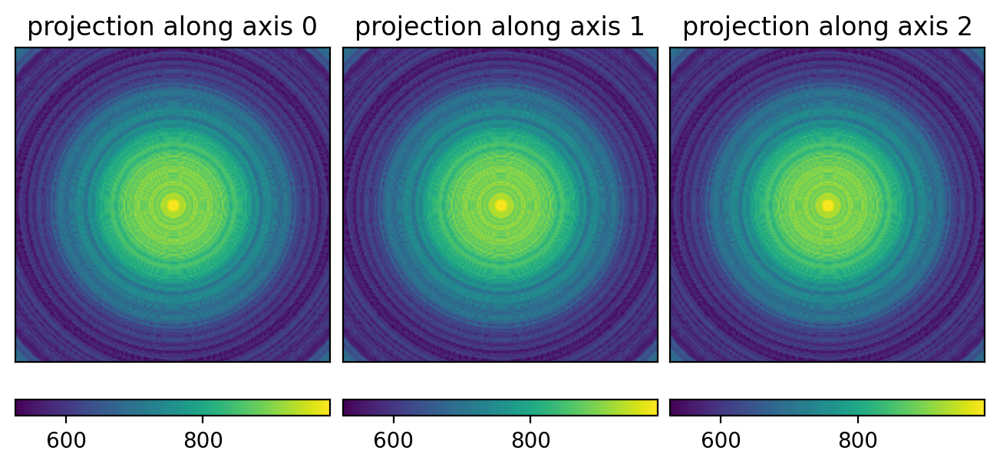

In [311]:
plot3d(np.log(np.abs(interp.reshape(n, n, n))))

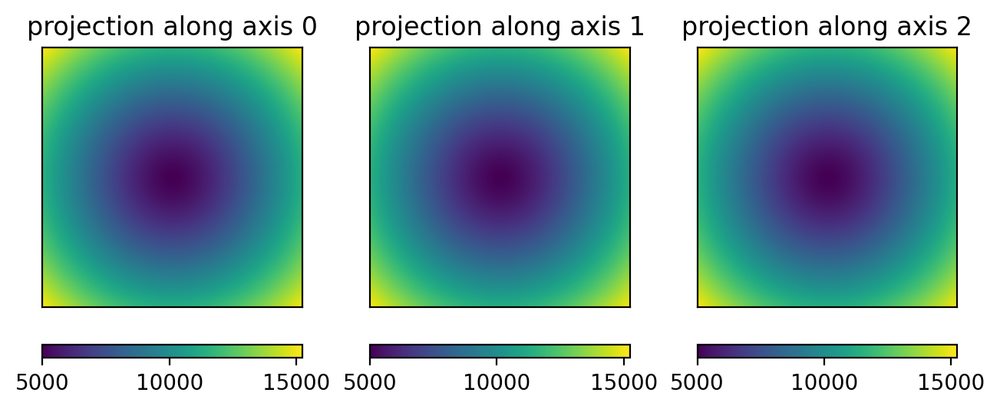

In [305]:
plot3d(np.abs(R.ravel().reshape(n, n, n)))

## Ice iteration

In [350]:
avogadro = 6.02214076e23
density_of_amorphous_ice = 0.94  # [g/cm3]
molar_mass_of_water = 18.01528  # [g/mol]
ndensity_of_amorphous_ice = (
    density_of_amorphous_ice * avogadro / molar_mass_of_water * 1e-24
)  # [particles / A3]

dv = dx**3
nv = n**3
total_vol = nv * dv  # A^3
n_ice_molecules = int(ndensity_of_amorphous_ice * total_vol)
print(n_ice_molecules)

# sample ice positions
# this may cause overlapping ice molecules.
ice_idx = np.random.choice(n**3, n_ice_molecules, replace=False)
ice_vol_init = torch.zeros(n**3)
ice_vol_init[ice_idx] = 1
ice_vol_init = ice_vol_init.reshape(n, n, n)

# x_ice = (torch.rand(n_ice_molecules) - 0.5) * dx * n
# y_ice = (torch.rand(n_ice_molecules) - 0.5) * dx * n
# z_ice = (torch.rand(n_ice_molecules) - 0.5) * dx * n
# ice_centers = torch.stack((x_ice, y_ice, z_ice), dim=1)
# ice_centers.shape

31422


In [357]:
np.mod(90, 90)

0

In [446]:
peaks = peak_local_max(new_ice.numpy(), num_peaks=n_ice_molecules, min_distance=3)
len(peaks)

22500

In [428]:
niter = 300
ice_vol = ice_vol_init.clone()
for i in tqdm(range(niter)):
    ice_vol_f = fftn(ice_vol)
    j = np.mod(i, 90)
    # ice_vol_f *= ices_f[j]
    # ice_vol_f = torch.abs(ices_f[j]) * torch.exp(1j*torch.angle(ice_vol_f))
    ice_vol_f = torch.abs(ices_f[0]) * torch.exp(1j * torch.angle(ice_vol_f))
    # ice_vol_f *= ices_f.mean(dim=0)
    new_ice = torch.abs(ifftn(ice_vol_f))
    peaks = peak_local_max(new_ice.numpy(), num_peaks=n_ice_molecules, min_distance=2)

    ice_vol = torch.zeros(n, n, n)
    for peak in peaks:
        ice_vol[*peak] = 1

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 300/300 [21:20<00:00,  4.27s/it]


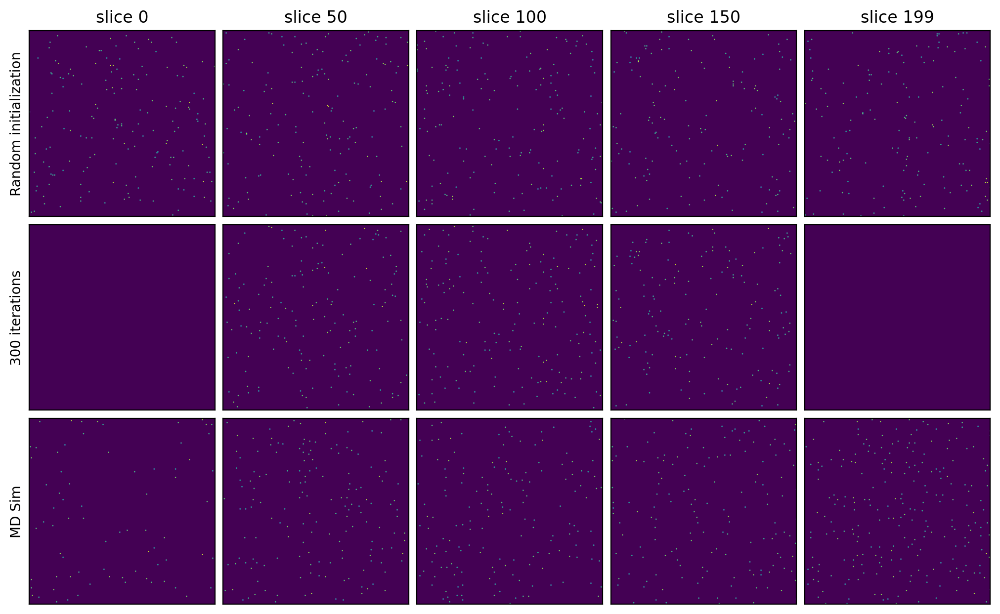

In [429]:
fig, axes = plt.subplots(3, 5, constrained_layout=True, figsize=(10, 6.1), dpi=200)
[ax.set(xticks=[], yticks=[]) for ax in axes.ravel()]
for i in range(5):
    if i == 4:
        idx = 199
    else:
        idx = i * 50
    ax = axes[0, i]
    ax.imshow(ice_vol_init[idx])
    ax.set_title(f"slice {idx}")

    ax = axes[1, i]
    ax.imshow(ice_vol[idx])

    ax = axes[2, i]
    ax.imshow(mdsim_ice_deltas[idx])
axes[0, 0].set_ylabel("Random initialization")
axes[1, 0].set_ylabel("300 iterations")
axes[2, 0].set_ylabel("MD Sim")
plt.show()

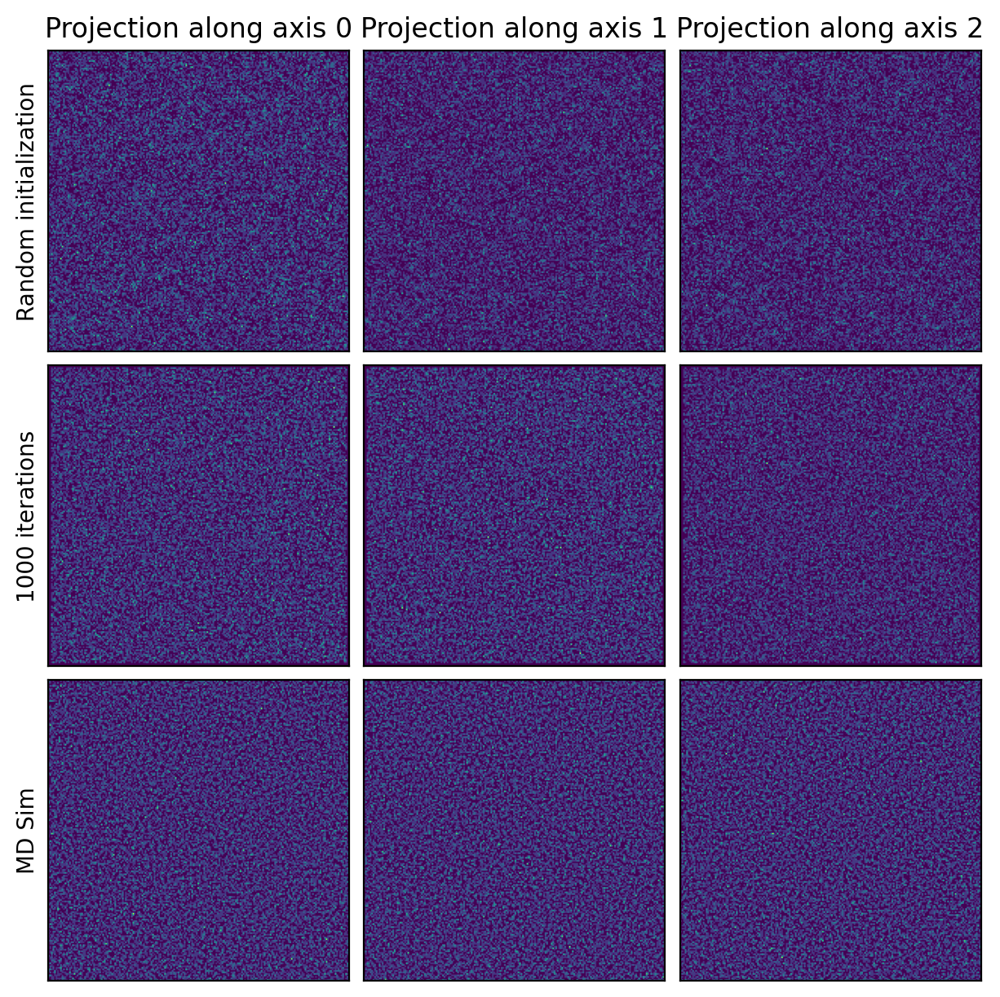

In [430]:
fig, axes = plt.subplots(3, 3, constrained_layout=True, figsize=(6, 6), dpi=200)
[ax.set(xticks=[], yticks=[]) for ax in axes.ravel()]
for i in range(3):
    ax = axes[0, i]
    ax.imshow(ice_vol_init.sum(dim=i))
    ax.set_title(f"Projection along axis {i}")

    ax = axes[1, i]
    ax.imshow(ice_vol.sum(dim=i))

    ax = axes[2, i]
    ax.imshow(mdsim_ice_deltas.sum(dim=i))
axes[0, 0].set_ylabel("Random initialization")
axes[1, 0].set_ylabel("1000 iterations")
axes[2, 0].set_ylabel("MD Sim")
plt.show()

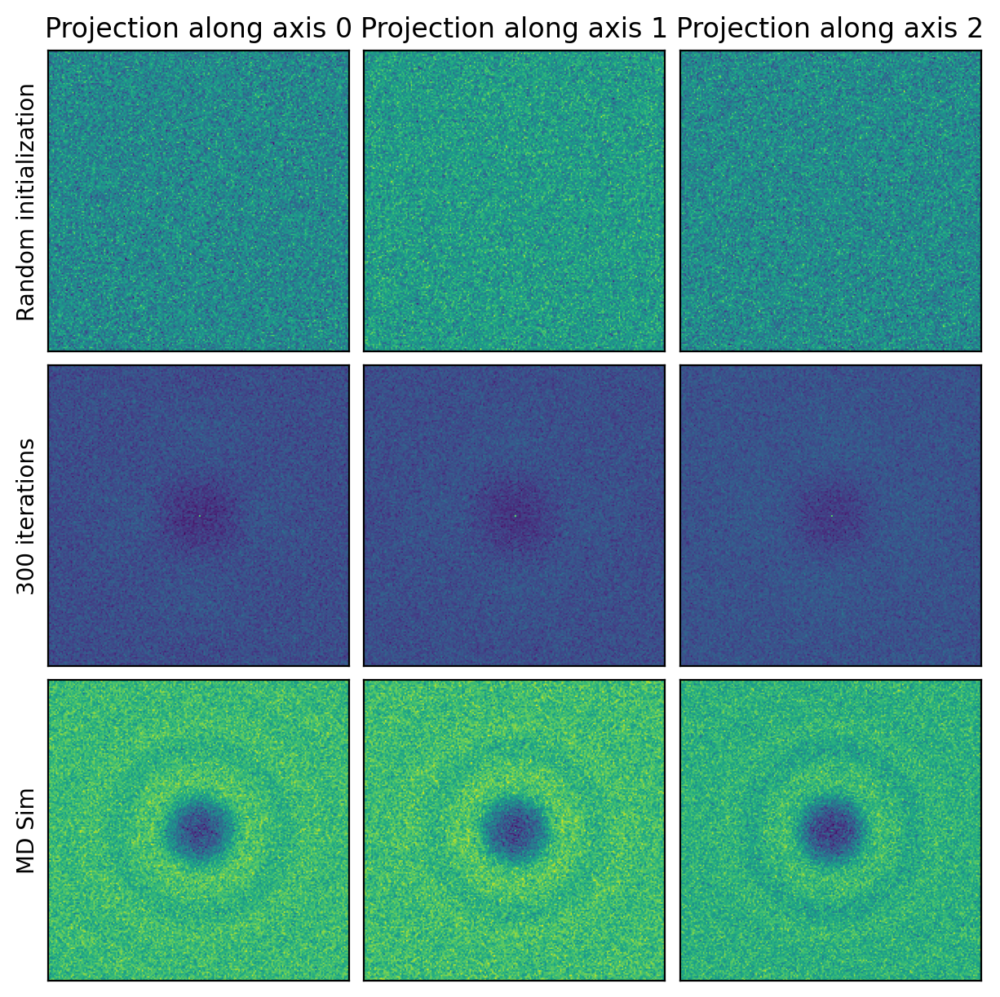

In [431]:
ice_vol_init_logabsf = torch.log(torch.abs(fftn(ice_vol_init)))
ice_vol_logabsf = torch.log(torch.abs(fftn(ice_vol)))
mdsim_ice_deltas_logabsf = torch.log(torch.abs(fftn(mdsim_ice_deltas)))

fig, axes = plt.subplots(3, 3, constrained_layout=True, figsize=(6, 6), dpi=200)
[ax.set(xticks=[], yticks=[]) for ax in axes.ravel()]
for i in range(3):
    ax = axes[0, i]
    ax.imshow(ice_vol_init_logabsf.sum(dim=i))
    ax.set_title(f"Projection along axis {i}")

    ax = axes[1, i]
    ax.imshow(ice_vol_logabsf.sum(dim=i))

    ax = axes[2, i]
    ax.imshow(mdsim_ice_deltas_logabsf.sum(dim=i))
axes[0, 0].set_ylabel("Random initialization")
axes[1, 0].set_ylabel("300 iterations")
axes[2, 0].set_ylabel("MD Sim")
plt.show()

In [432]:
kx = torch.fft.fftfreq(n, dx)
dk = kx[1] - kx[0]

In [433]:
radial_profile_real = radial_profile_3d(ice_vol.real)
radial_profile_imag = radial_profile_3d(ice_vol.imag)

RuntimeError: imag is not implemented for tensors with non-complex dtypes.

In [283]:
avg_radial_profile_real = radial_profile_3d(ices_f.mean(dim=0).real)
avg_radial_profile_imag = radial_profile_3d(ices_f.mean(dim=0).imag)

In [284]:
k = torch.arange(len(radial_profile_real)) * dk

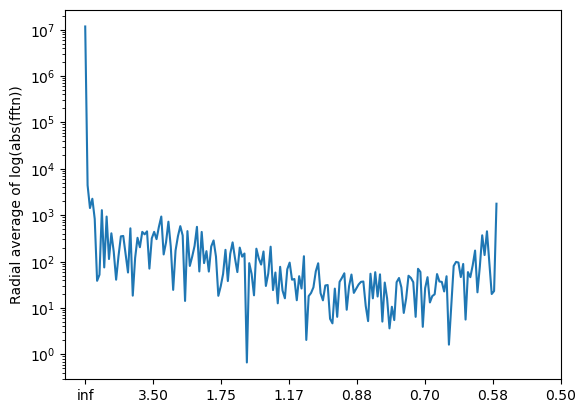

In [394]:
nticks = 8
maxk = 2
plt.semilogy(k, np.abs(radial_profile_real + 1j * radial_profile_imag))
# plt.semilogy(k, np.abs(avg_radial_profile_real + 1j*avg_radial_profile_imag))
plt.xticks(
    torch.linspace(0, maxk, nticks),
    labels=[f"{1/k:.2f}" for k in torch.linspace(0, maxk, nticks)],
)
plt.ylabel("Radial average of log(abs(fftn))")
plt.show()

## Averaged ice

In [448]:
n = 200
dx = 0.5

x, y, z, X, Y, Z = potential.coordinate_grid_3d((n, n, n), (dx, dx, dx))

In [449]:
dx = 0.5
n = 200
super_sampling_factor = 4

mdsim_ice_deltas = []

for frame in tqdm(indexes[10:]):
    coordstart = frame + 9
    coords = get_coordinates_from_frame(coordstart)

    # recenters coordinates onto origin (0,0,0)
    center = pdbtools.center_of_particle(coords)
    centered_coords = coords - center.reshape(1, -1)
    centered_coords = trim_coordinates(centered_coords, trim_size=100)

    mdsim_ice_delta = torch.zeros(n, n, n)
    for cc in centered_coords:
        xi, yi, zi = potential.nearest_index(x, y, z, cc[0], cc[1], cc[2])
        mdsim_ice_delta[zi, yi, xi] = 1

    mdsim_ice_deltas.append(mdsim_ice_delta)

mdsim_ice_deltas = torch.stack(mdsim_ice_deltas)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 91/91 [06:55<00:00,  4.56s/it]


In [450]:
mdsim_ice_deltas_f = []
for mdsim_ice_delta in tqdm(mdsim_ice_deltas):
    mdsim_ice_deltas_f.append(fftn(mdsim_ice_delta))
mdsim_ice_deltas_f = torch.stack(mdsim_ice_deltas_f)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 91/91 [00:02<00:00, 39.41it/s]


In [451]:
mdsim_ice_deltas_f_abs_avg = torch.mean(torch.abs(mdsim_ice_deltas_f), dim=0)

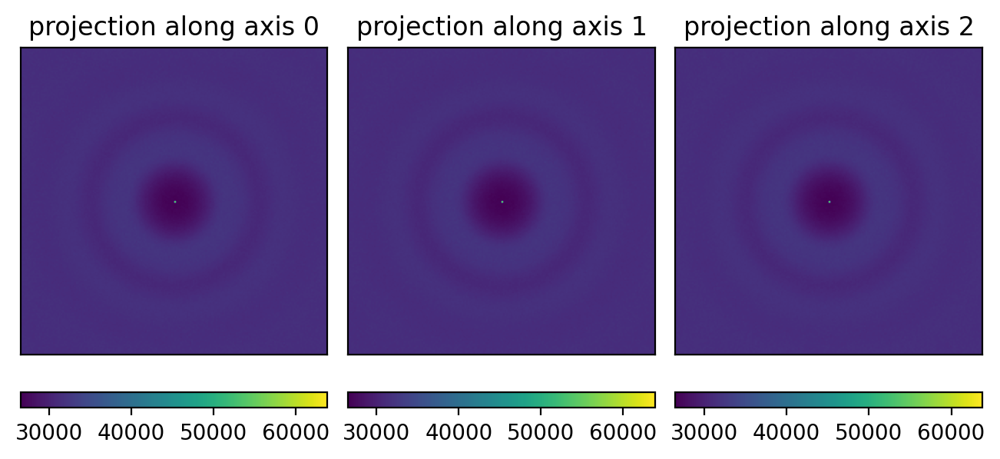

In [452]:
plot3d(mdsim_ice_deltas_f_abs_avg)

In [453]:
kx = torch.fft.fftfreq(n, dx)
dk = kx[1] - kx[0]

In [454]:
mdsim_ice_deltas_f_abs_avg_radial = radial_profile_3d(mdsim_ice_deltas_f_abs_avg)

In [455]:
k = torch.arange(len(mdsim_ice_deltas_f_abs_avg_radial)) * dk

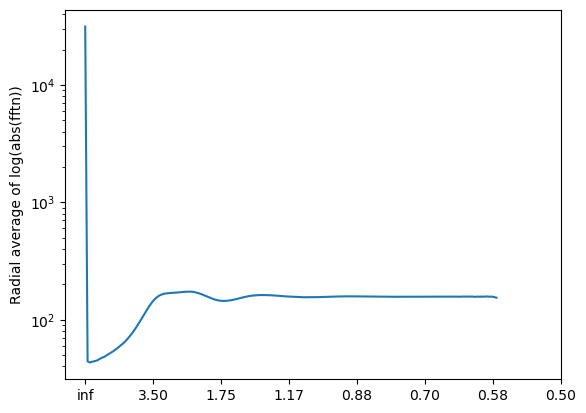

In [456]:
nticks = 8
maxk = 2
plt.semilogy(k, mdsim_ice_deltas_f_abs_avg_radial)
# plt.semilogy(k, np.abs(avg_radial_profile_real + 1j*avg_radial_profile_imag))
plt.xticks(
    torch.linspace(0, maxk, nticks),
    labels=[f"{1/k:.2f}" for k in torch.linspace(0, maxk, nticks)],
)
plt.ylabel("Radial average of log(abs(fftn))")
plt.show()

## Generate initial positions

In [493]:
avogadro = 6.02214076e23
density_of_amorphous_ice = 0.94  # [g/cm3]
molar_mass_of_water = 18.01528  # [g/mol]
ndensity_of_amorphous_ice = (
    density_of_amorphous_ice * avogadro / molar_mass_of_water * 1e-24
)  # [particles / A3]

dv = dx**3
nv = n**3
total_vol = nv * dv  # A^3
n_ice_molecules = int(ndensity_of_amorphous_ice * total_vol)
print(n_ice_molecules)

# sample ice positions
# this may cause overlapping ice molecules.
ice_idx = np.random.choice(n**3, n_ice_molecules, replace=False)
ice_vol_init = torch.zeros(n**3)
ice_vol_init[ice_idx] = 1
ice_vol_init = ice_vol_init.reshape(n, n, n)

31422


## Generate initial positions with minimum distance
https://stackoverflow.com/questions/27499139/how-can-i-set-a-minimum-distance-constraint-for-generating-points-with-numpy-ran

In [624]:
n, dx

(200, 0.5)

In [742]:
def generate_points_with_min_distance(n_points, nx, dx, min_dist):
    # compute grid shape based on number of points
    num_z = int(n_points ** (1 / 3))
    num_y = num_z
    num_x = num_z

    # create regularly spaced neurons
    xstart = -nx * dx / 2
    xend = -nx * dx / 2 + (nx - 1) * dx
    x = np.linspace(xstart, xend, num_x, dtype=np.float32)
    coords = np.stack(np.meshgrid(x, x, x), -1).reshape(-1, 3)

    # compute spacing
    init_dist = x[1] - x[0]

    # perturb points
    max_movement = (init_dist - min_dist) / 2
    print(max_movement)
    noise = np.random.uniform(
        low=-max_movement, high=max_movement, size=(len(coords), 3)
    )
    coords += noise

    return coords

1.4083328247070312
29791


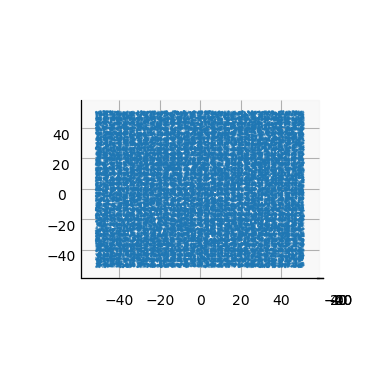

In [766]:
# coords = generate_points_with_min_distance(n_ice_molecules, 200, dx, min_dist=2)
coords = generate_points_with_min_distance(n_ice_molecules, 200, dx, min_dist=0.5)
print(len(coords))

# plot
fig = plt.figure()
ax = fig.add_subplot(projection="3d")
# ax = fig.add_subplot()
ax.scatter(coords[:, 0], coords[:, 1], coords[:, 2], s=0.5)
ax.set_proj_type('ortho')
ax.view_init(elev=0., azim=0)
plt.show()

In [767]:
init_min_distance_ice_deltas = torch.zeros(n, n, n)
x, y, z, X, Y, Z = potential.coordinate_grid_3d((n, n, n), (dx, dx, dx))

coords = trim_coordinates(torch.from_numpy(coords), trim_size=100)
for cc in coords:
    xi, yi, zi = potential.nearest_index(x, y, z, cc[0], cc[1], cc[2])
    init_min_distance_ice_deltas[zi, yi, xi] = 1

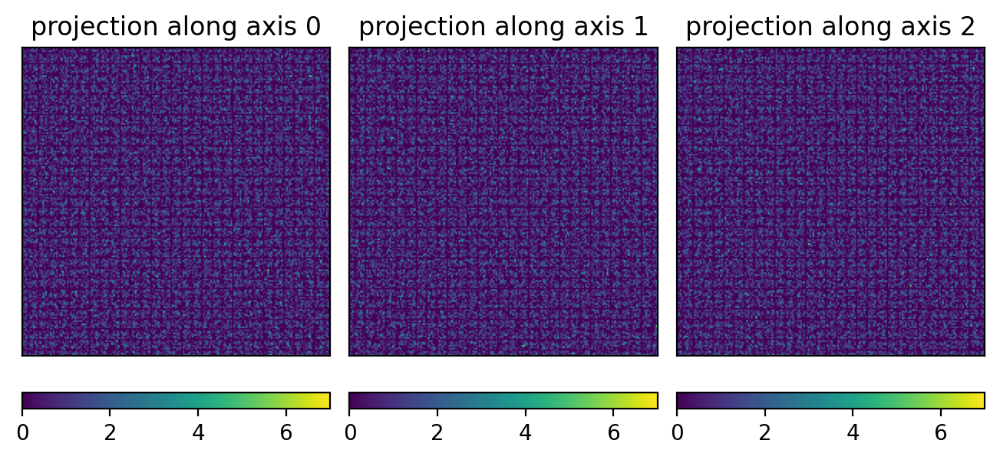

In [768]:
plot3d(init_min_distance_ice_deltas)

In [825]:
niter = 5
current_ice_vol = ice_vol_init.clone()
# current_ice_vol = mdsim_ice_delta.clone()
# current_ice_vol = init_min_distance_ice_deltas.clone()

frob_norm = []
n_extras = []

for i in tqdm(range(niter)):
    prev_ice_vol = current_ice_vol.clone()
    ice_vol_f = fftn(current_ice_vol)
    ice_vol_f *= mdsim_ice_deltas_f_abs_avg
    # ice_vol_f = mdsim_ice_deltas_f_abs_avg * torch.exp(1j * torch.angle(ice_vol_f))
    new_ice = torch.abs(ifftn(ice_vol_f))
    peaks = peak_local_max(
        new_ice.numpy(), num_peaks=n_ice_molecules, min_distance=3, exclude_border=False
    )

    ice_vol = torch.zeros(n, n, n)
    for peak in peaks:
        ice_vol[*peak] = 1

    # add more ice if needed
    if len(peaks) < n_ice_molecules:
        n_extra = n_ice_molecules - len(peaks)
        n_extras.append(n_extra)
        zero_idx = (ice_vol == 0).nonzero()
        idx = np.random.choice(len(zero_idx), n_extra, replace=False)
        for i in idx:
            ice_vol[*zero_idx[i]] = 1

    frob_norm.append(torch.mean(torch.abs(current_ice_vol - ice_vol) ** 2))
    current_ice_vol = ice_vol
frob_norm = torch.stack(frob_norm)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:21<00:00,  4.22s/it]


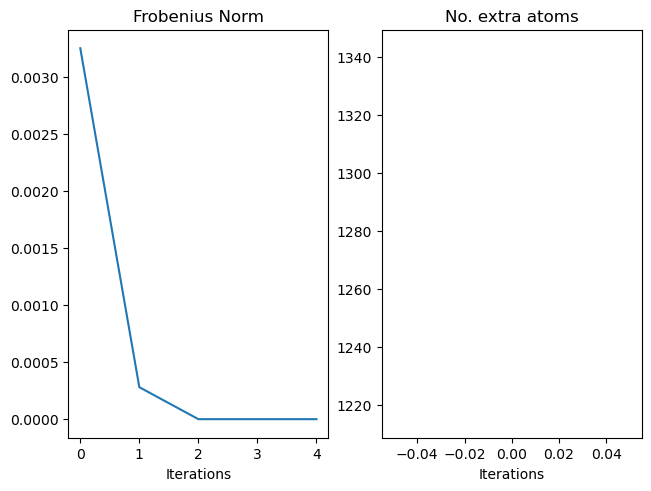

In [826]:
fig, axes = plt.subplots(1, 2, constrained_layout=True)
ax = axes[0]
ax.plot(frob_norm)
ax.set_title("Frobenius Norm")
ax.set_xlabel("Iterations")

ax = axes[1]
ax.plot(n_extras)
ax.set_title("No. extra atoms")
ax.set_xlabel("Iterations")
plt.show()

In [ ]:
fig, axes = plt.subplots(3, 5, constrained_layout=True, figsize=(10, 6.1), dpi=200)
[ax.set(xticks=[], yticks=[]) for ax in axes.ravel()]
for i in range(5):
    if i == 4:
        idx = 199
    else:
        idx = i * 50
    ax = axes[0, i]
    ax.imshow(ice_vol_init[idx])
    ax.set_title(f"slice {idx}")

    ax = axes[1, i]
    ax.imshow(ice_vol[idx])

    ax = axes[2, i]
    ax.imshow(mdsim_ice_delta[idx])
axes[0, 0].set_ylabel("Random initialization")
axes[1, 0].set_ylabel(f"{niter} iterations")
axes[2, 0].set_ylabel("MD Sim")
plt.show()

In [ ]:
fig, axes = plt.subplots(3, 3, constrained_layout=True, figsize=(6, 6), dpi=200)
[ax.set(xticks=[], yticks=[]) for ax in axes.ravel()]
for i in range(3):
    ax = axes[0, i]
    ax.imshow(ice_vol_init.sum(dim=i))
    ax.set_title(f"Projection along axis {i}")

    ax = axes[1, i]
    ax.imshow(ice_vol.sum(dim=i))

    ax = axes[2, i]
    ax.imshow(mdsim_ice_delta.sum(dim=i))
axes[0, 0].set_ylabel("Random initialization")
axes[1, 0].set_ylabel(f"{niter} iterations")
axes[2, 0].set_ylabel("MD Sim")
plt.show()

In [ ]:
ice_vol_init_logabsf = torch.log(torch.abs(fftn(ice_vol_init)))
ice_vol_logabsf = torch.log(torch.abs(fftn(ice_vol)))
mdsim_ice_delta_logabsf_avg = torch.log(mdsim_ice_deltas_f_abs_avg)
mdsim_ice_delta_logabsf = torch.log(torch.abs(fftn(mdsim_ice_delta)))

fig, axes = plt.subplots(4, 3, constrained_layout=True, figsize=(6, 8), dpi=200)
[ax.set(xticks=[], yticks=[]) for ax in axes.ravel()]
for i in range(3):
    ax = axes[0, i]
    ax.imshow(ice_vol_init_logabsf.sum(dim=i))
    ax.set_title(f"Projection along axis {i}")

    ax = axes[1, i]
    ax.imshow(ice_vol_logabsf.sum(dim=i))

    ax = axes[2, i]
    ax.imshow(mdsim_ice_delta_logabsf.sum(dim=i))

    ax = axes[3, i]
    ax.imshow(mdsim_ice_delta_logabsf_avg.sum(dim=i))
axes[0, 0].set_ylabel("Random initialization")
axes[1, 0].set_ylabel(f"{niter} iterations")
axes[2, 0].set_ylabel("MD sim")
axes[3, 0].set_ylabel("MD Sim avg")
plt.show()